In [26]:
from models import StyleEncoder, MapperNetwork, Generator
from lpips_pytorch import LPIPS
from pathlib import Path
import torch
import numpy as np
from train import to_image
from datasets import CelebADataset
from utils import *
from torchvision import transforms

transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(256),
        transforms.ToTensor(),
        transforms.Normalize(mean=means,
                            std=stds)
    ])


In [2]:
domains = ["Blond_Hair", "Eyeglasses", "No_Beard", 'Male', 'Young', 'Black_Hair', 'Bald', 'Smiling', \
            'Attractive', 'Wearing_Necklace']
N_domains = len(domains)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
CHECKPOINT_PATH = 'checkpoints/2ffjilx3/checkpoint-10000.pt'
CHECKPOINT_PATH = 'checkpoints/adzsq20x/checkpoint-10000.pt' # better than 2ffjilx3
CHECKPOINT_PATH = 'checkpoints/r193e30t/checkpoint-9000.pt'

generator = Generator()
mapper = MapperNetwork(K_domains=N_domains)
styler = StyleEncoder(N_domains)

state = torch.load(CHECKPOINT_PATH)
generator.load_state_dict(state['generator_ema'])
mapper.load_state_dict(state['mapper_ema'])
styler.load_state_dict(state['styler_ema'])
generator.to(device), mapper.to(device), styler.to(device)
del state

In [4]:
s = '-1 -1 -1  1 -1 -1 -1  1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1  1 -1  1 -1 -1  1 -1 -1 -1 -1 -1 -1  1 -1 -1 -1 -1 -1 -1 -1  1'.split()
all = '5_o_Clock_Shadow Arched_Eyebrows Attractive Bags_Under_Eyes Bald Bangs Big_Lips Big_Nose Black_Hair Blond_Hair Blurry Brown_Hair Bushy_Eyebrows Chubby Double_Chin Eyeglasses Goatee Gray_Hair Heavy_Makeup High_Cheekbones Male Mouth_Slightly_Open Mustache Narrow_Eyes No_Beard Oval_Face Pale_Skin Pointy_Nose Receding_Hairline Rosy_Cheeks Sideburns Smiling Straight_Hair Wavy_Hair Wearing_Earrings Wearing_Hat Wearing_Lipstick Wearing_Necklace Wearing_Necktie Young'.split()
for i in range(len(s)):
    if s[i] == '1':
        print(all[i])

Bags_Under_Eyes
Big_Nose
Brown_Hair
High_Cheekbones
Mouth_Slightly_Open
No_Beard
Smiling
Young


In [27]:
dataset = CelebADataset(transform=transform, attributes=domains)

In [29]:
references_images = []
i = 0
for domain in range(len(domains)):
    while dataset[i][1]['attributes'][domain] != 1:
        i += 1
    references_images.append(to_image(dataset[i][0]))
    i += 1

# Attribute conversion

Let's find images with different attributes and try to amplify each attribute using mapper

In [30]:
import copy
table = [[None] * (1 + N_domains) for i in range(N_domains + 1)]
for i in range(1, N_domains + 1):
    table[i][0] = table[0][i] = references_images[i - 1]

for image_i in range(N_domains):
    for attr_i in range(N_domains):
        with torch.no_grad():
            z_trg = torch.randn((1, 16)).to(device)
            s_trg = mapper(z_trg, torch.tensor([attr_i], device=device))
            x_real = transform(references_images[image_i]).to(device)
            x_fake = generator(x_real.unsqueeze(0), s_trg)
            table[attr_i + 1][image_i + 1] = to_image(x_fake[0])


/tmp/ipykernel_1699172/3789562135.py:22: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


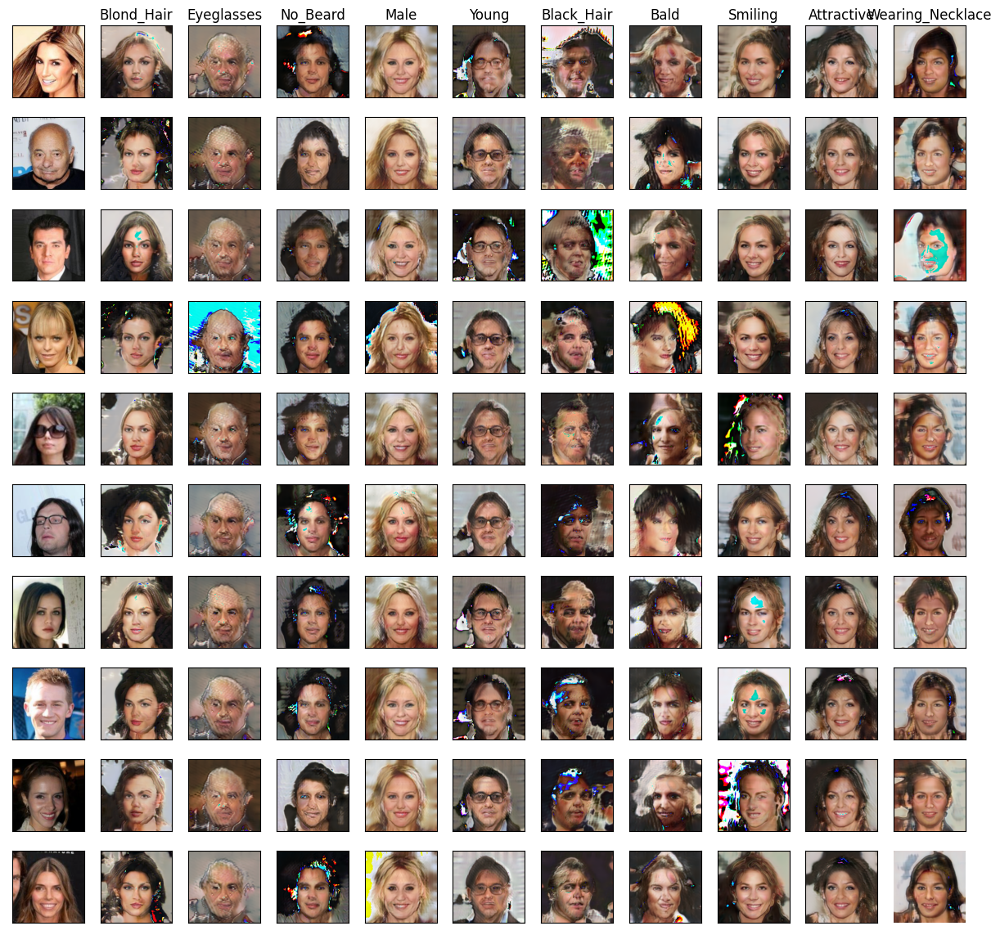

In [31]:
import matplotlib.pyplot as plt
R = N_domains + 1
C = N_domains
R, C = C, R

fig,ax = plt.subplots(R, C)
plt.axis('off')
fig.suptitle('Attribute change using mapper', fontsize=16)

for c in range(C):
    for r in range(R):
        image = table[c][r + 1]
        ax[r][c].imshow(image)
        fig.axes[r * C + c].get_xaxis().set_visible(False)
        fig.axes[r * C + c].get_yaxis().set_visible(False)
        ax[r][c].figure.set_size_inches(12, 12)
        if r == 0:
            if c >= 1:
                ax[r][c].set_title(domains[c - 1])
            else:
                ax[r][c].set_title("source")

for i in range(10):
    fig.tight_layout()
fig.show()

It can be seen, that mode collapse has occured.

### Let's try to convert attribute based on another picture (styler)


In [32]:
import copy
table = [[None] * (1 + N_domains) for i in range(N_domains + 1)]
for i in range(1, N_domains + 1):
    table[i][0] = table[0][i] = references_images[i - 1]

for image_i in range(N_domains):
    for attr_i in range(N_domains):
        with torch.no_grad():
            z_trg = torch.randn((1, 16)).to(device)
            attr_image = transform(references_images[attr_i]).unsqueeze(0).to(device)
            s_trg = styler(attr_image, torch.tensor([attr_i], device=device))
            x_real = transform(references_images[image_i]).to(device)
            x_fake = generator(x_real.unsqueeze(0), s_trg)
            table[attr_i + 1][image_i + 1] = to_image(x_fake[0])


/tmp/ipykernel_1699172/526999364.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


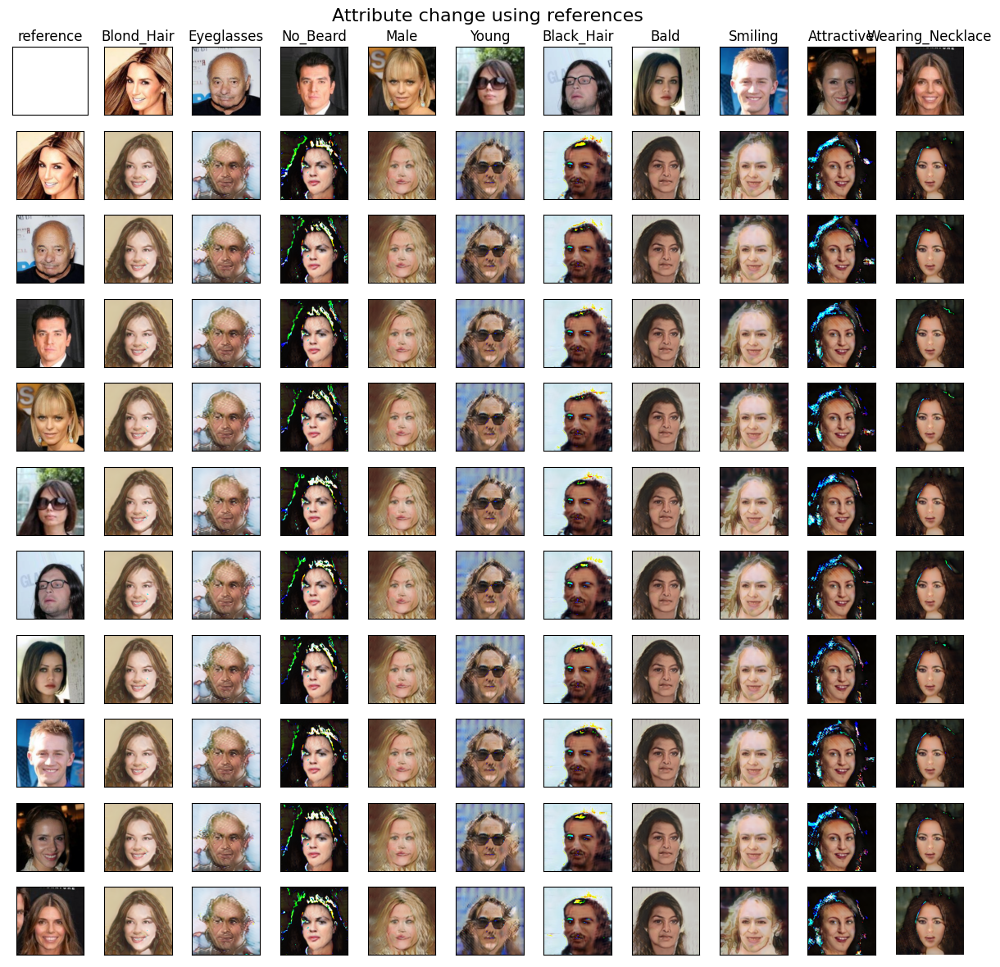

In [34]:
import matplotlib.pyplot as plt
R = N_domains + 1
C = N_domains + 1

fig,ax = plt.subplots(R, C)
plt.axis('off')
fig.suptitle('Attribute change using references', fontsize=16)

for c in range(C):
    for r in range(R):
        image = table[c][r]
        if r != 0 or c != 0:
            ax[r][c].imshow(image)
        fig.axes[r * C + c].get_xaxis().set_visible(False)
        fig.axes[r * C + c].get_yaxis().set_visible(False)
        ax[r][c].figure.set_size_inches(12, 12)
        if r == 0:
            if c >= 1:
                ax[r][c].set_title(domains[c - 1])
            else:
                ax[r][c].set_title("reference")

for i in range(10):
    fig.tight_layout()
fig.show()

### What if we use mixed latent to edit attributes?

In [35]:
import copy
table = [[None] * (1 + N_domains) for i in range(N_domains + 1)]
for i in range(1, N_domains + 1):
    table[i][0] = table[0][i] = references_images[i - 1]

for image_i in range(N_domains):
    for attr_i in range(N_domains):
        with torch.no_grad():
            z_trg = torch.randn((1, 16)).to(device)
            attr_image = transform(references_images[attr_i]).unsqueeze(0).to(device)
            x_real = transform(references_images[image_i]).to(device)
            s_trg1 = styler(attr_image, torch.tensor([attr_i], device=device))
            s_trg2 = styler(x_real, torch.tensor([attr_i], device=device))
            s_trg = 0.5 * s_trg1 + 0.5 * s_trg2
            x_fake = generator(x_real.unsqueeze(0), s_trg)
            table[attr_i + 1][image_i + 1] = to_image(x_fake[0])


/tmp/ipykernel_1699172/2228972900.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


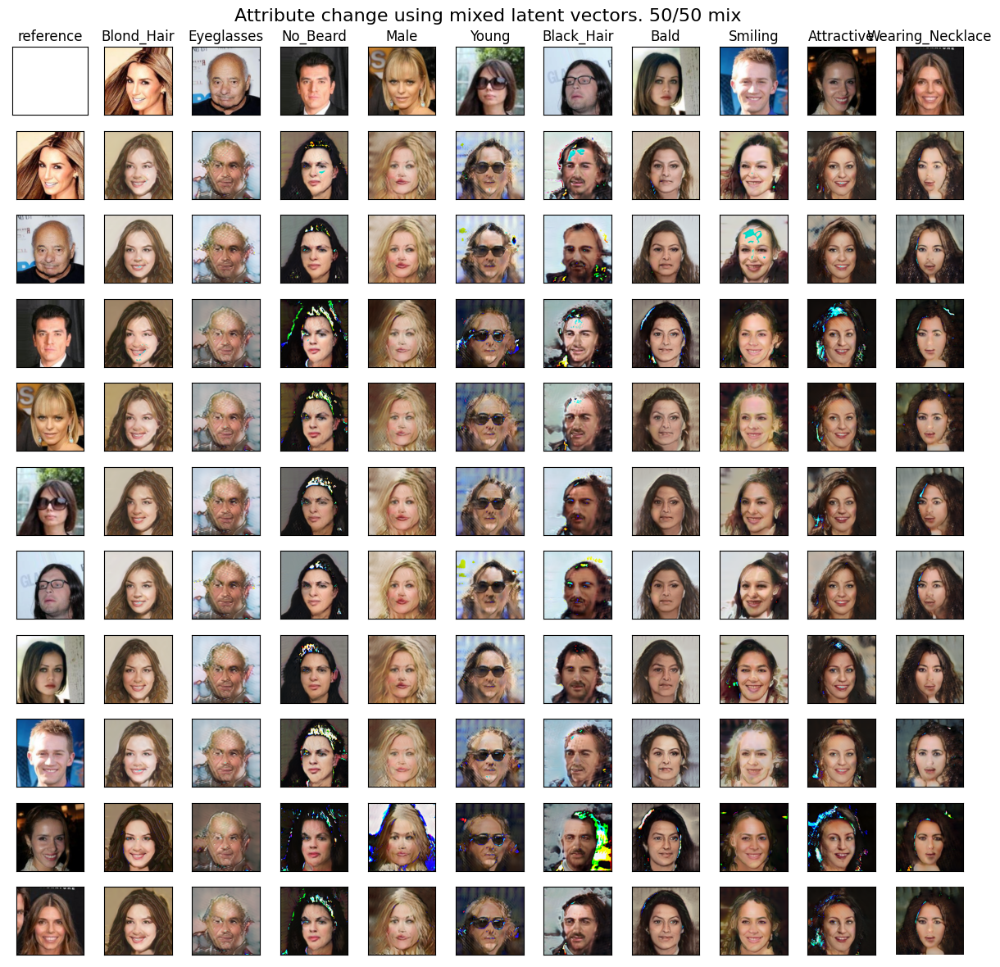

In [36]:
import matplotlib.pyplot as plt
R = N_domains + 1
C = N_domains + 1

fig,ax = plt.subplots(R, C)
plt.axis('off')
fig.suptitle('Attribute change using mixed latent vectors. 50/50 mix', fontsize=16)

for c in range(C):
    for r in range(R):
        image = table[c][r]
        if r != 0 or c != 0:
            ax[r][c].imshow(image)
        fig.axes[r * C + c].get_xaxis().set_visible(False)
        fig.axes[r * C + c].get_yaxis().set_visible(False)
        ax[r][c].figure.set_size_inches(12, 12)
        if r == 0:
            if c >= 1:
                ax[r][c].set_title(domains[c - 1])
            else:
                ax[r][c].set_title("reference")

for i in range(10):
    fig.tight_layout()
fig.show()

In [37]:
import copy
table = [[None] * (1 + N_domains) for i in range(N_domains + 1)]
for i in range(1, N_domains + 1):
    table[i][0] = table[0][i] = references_images[i - 1]

for image_i in range(N_domains):
    for attr_i in range(N_domains):
        with torch.no_grad():
            z_trg = torch.randn((1, 16)).to(device)
            attr_image = transform(references_images[attr_i]).unsqueeze(0).to(device)
            x_real = transform(references_images[image_i]).to(device)
            s_trg1 = styler(attr_image, torch.tensor([attr_i], device=device))
            s_trg2 = styler(x_real, torch.tensor([attr_i], device=device))
            s_trg = 0.25 * s_trg1 + 0.75 * s_trg2
            x_fake = generator(x_real.unsqueeze(0), s_trg)
            table[attr_i + 1][image_i + 1] = to_image(x_fake[0])


/tmp/ipykernel_1699172/3494292147.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


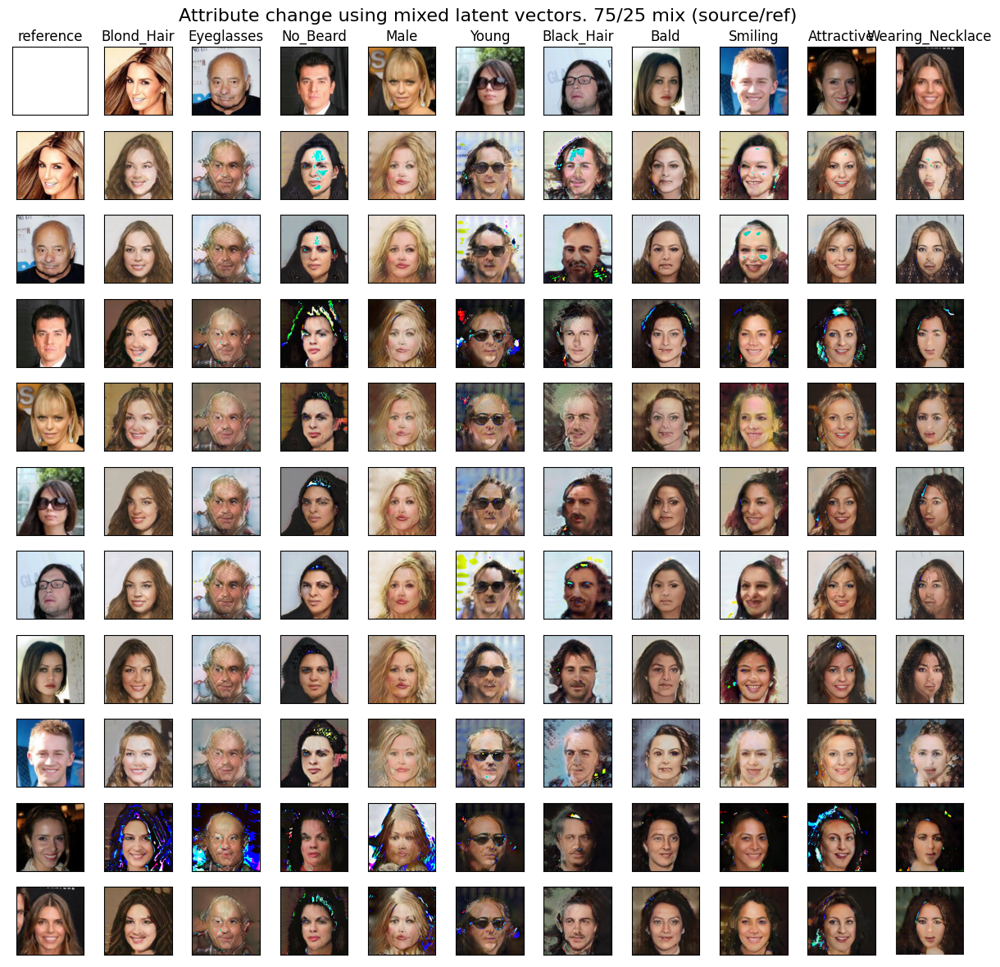

In [38]:
import matplotlib.pyplot as plt
R = N_domains + 1
C = N_domains + 1

fig,ax = plt.subplots(R, C)
plt.axis('off')
fig.suptitle('Attribute change using mixed latent vectors. 75/25 mix (source/ref)', fontsize=16)

for c in range(C):
    for r in range(R):
        image = table[c][r]
        if r != 0 or c != 0:
            ax[r][c].imshow(image)
        fig.axes[r * C + c].get_xaxis().set_visible(False)
        fig.axes[r * C + c].get_yaxis().set_visible(False)
        ax[r][c].figure.set_size_inches(12, 12)
        if r == 0:
            if c >= 1:
                ax[r][c].set_title(domains[c - 1])
            else:
                ax[r][c].set_title("reference")

for i in range(10):
    fig.tight_layout()
fig.show()

In [39]:
import copy
table = [[None] * (1 + N_domains) for i in range(N_domains + 1)]
for i in range(1, N_domains + 1):
    table[i][0] = table[0][i] = references_images[i - 1]

for image_i in range(N_domains):
    for attr_i in range(N_domains):
        with torch.no_grad():
            z_trg = torch.randn((1, 16)).to(device)
            attr_image = transform(references_images[attr_i]).unsqueeze(0).to(device)
            x_real = transform(references_images[image_i]).to(device)
            s_trg1 = styler(attr_image, torch.tensor([attr_i], device=device))
            s_trg2 = styler(x_real, torch.tensor([attr_i], device=device))
            s_trg = 0.75 * s_trg1 + 0.25 * s_trg2
            x_fake = generator(x_real.unsqueeze(0), s_trg)
            table[attr_i + 1][image_i + 1] = to_image(x_fake[0])


/tmp/ipykernel_1699172/3377825564.py:25: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


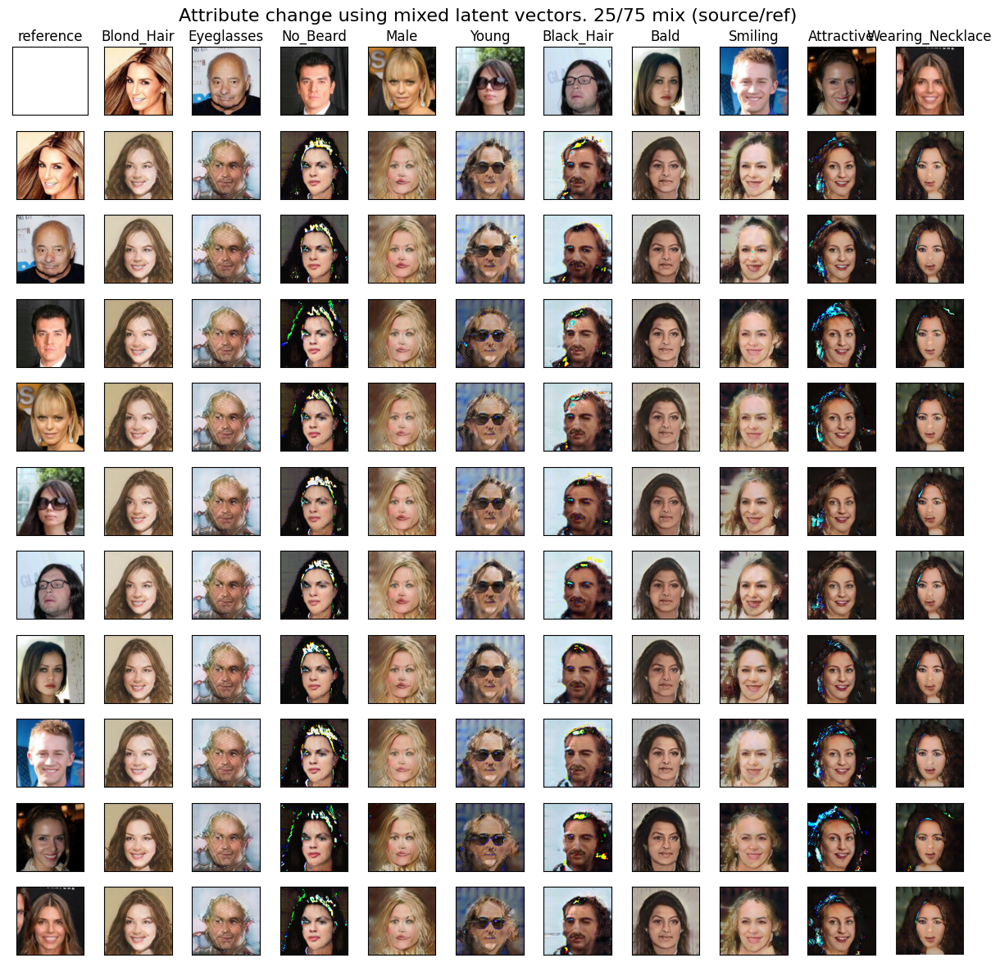

In [40]:
import matplotlib.pyplot as plt
R = N_domains + 1
C = N_domains + 1

fig,ax = plt.subplots(R, C)
plt.axis('off')
fig.suptitle('Attribute change using mixed latent vectors. 25/75 mix (source/ref)', fontsize=16)

for c in range(C):
    for r in range(R):
        image = table[c][r]
        if r != 0 or c != 0:
            ax[r][c].imshow(image)
        fig.axes[r * C + c].get_xaxis().set_visible(False)
        fig.axes[r * C + c].get_yaxis().set_visible(False)
        ax[r][c].figure.set_size_inches(12, 12)
        if r == 0:
            if c >= 1:
                ax[r][c].set_title(domains[c - 1])
            else:
                ax[r][c].set_title("reference")

for i in range(10):
    fig.tight_layout()
fig.show()